# Correlations and Multicolinearity

In this notebook, we examine and plot the correlations between Features and Saleprirce as well as start to group features that may be multicolinear. We take slightly different approaches for continuous vs categorical features. 

As always, here are quick links to the Kaggle Definitions and Variables for the AMES Dataset. 
 - [Column Definitions](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data)
 - [Column Variables](https://www.kaggle.com/datasets/ahmedmohameddawoud/ames-housing-data)


<p><a name="top"></a></p>

Contents:
 - <a href="#cont">Continuous Features</a><br>
 - <a href="#cat">Categorical Features</a><br>

In [3]:
housing_d = pd.read_csv('housing_cleaned.csv', index_col=0)
housing_d = housing_d.convert_dtypes()

In [54]:
continuous = ['SalePrice','GrLivArea','LotFrontage','LotArea','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1',
              'BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','BsmtFullBath',
             'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt',
              'GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea',
              'MiscVal','OverallQual','OverallCond']

continuous_wlog = ['SalePrice','GrLivArea','LotFrontage','LotArea','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1',
              'BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','BsmtFullBath',
             'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt',
              'GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea',
              'MiscVal','SalesPrice_log','SalePrice_box']

categorical = ['MSSubClass','MSZoning','Street','LotShape','LandContour','Utilities','LotConfig','LandSlope',
              'Neighborhood','Condition1','Condition2','BldgType','HouseStyle',
              'RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation',
              'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir',
              'Electrical','KitchenQual','Functional','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive',
               'PoolQC','Fence','MiscFeature','MoSold','SaleType','SaleCondition','YrSold']


Decisions/Changes regarding feature type to Continuous and Cateogrical Features:
- Move OverallQual from categorical to continuous
- Move OverallCond from categorical to continuous
- Move MoSold from continuous to categorical
- Move YrSold from continuous to categorical
- Move MSSubClass from continuous to categorical

In [6]:
#OneHot Encoder
encoder = OneHotEncoder(sparse_output=False, drop='first')

In [7]:
df = housing_d.reset_index().drop('PID',axis=1)

# Fit the encoder and transform the 'Category' column
encoded_array = encoder.fit_transform(df[categorical])

# Convert the encoded data to a DataFrame
encoded_df = pd.DataFrame(encoded_array, columns=encoder.get_feature_names_out(categorical))
encoded_df #2559x15, automatically drops the first one
df_encoded = pd.concat([df, encoded_df], axis=1)
df_encoded.drop(categorical, axis=1, inplace=True)
df_encoded.shape #(2559, 301)

(2559, 289)

In [8]:
list(df_encoded.columns)

['GrLivArea',
 'SalePrice',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MapRefNo',
 'Prop_Addr',
 'lat',
 'long',
 'MSSubClass_30.0',
 'MSSubClass_40.0',
 'MSSubClass_45.0',
 'MSSubClass_50.0',
 'MSSubClass_60.0',
 'MSSubClass_70.0',
 'MSSubClass_75.0',
 'MSSubClass_80.0',
 'MSSubClass_85.0',
 'MSSubClass_90.0',
 'MSSubClass_120.0',
 'MSSubClass_150.0',
 'MSSubClass_160.0',
 'MSSubClass_180.0',
 'MSSubClass_190.0',
 'MSZoning_FV',
 'MSZoning_I (all)',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'L

<p><a name="cont"></a></p>

#### Continuous Feature Correlations <a href="#top">[top]</a><br>

1. <a href="#cont_p">Plotting Features v SalePrice</a><br>
2. <a href="#heat">Correlation Heatmaps</a><br>
3. <a href="#top_15">Top 15 Features</a><br>
4. <a href="#r2">Multicolinearity R2 tests</a><br>

<p><a name="cont_p"></a></p>

#### Plotting Features v SalePrice <a href="#top">[top]</a><br>

In [51]:
#Continous Variables

fig, axs = plt.subplots(86, 1, figsize=(20, 450))
for num, column in enumerate(housing_d.select_dtypes(include=['int','float']).columns):
    housing_d[[column,'SalePrice']].plot.scatter(x=column, y = 'SalePrice', ax = axs[num*2])
    axs[num*2].set_title(column)
    axs[num*2].grid(True)
    housing_d[[column,'SalesPrice_log']].plot.scatter(x=column, y = 'SalesPrice_log', ax = axs[2*num+1])
    axs[2*num+1].set_title(column + ' Log')
    axs[2*num+1].grid(True)
plt.show()

<p><a name="heat"></a></p>

#### Correlation Heatmaps <a href="#top">[top]</a><br>

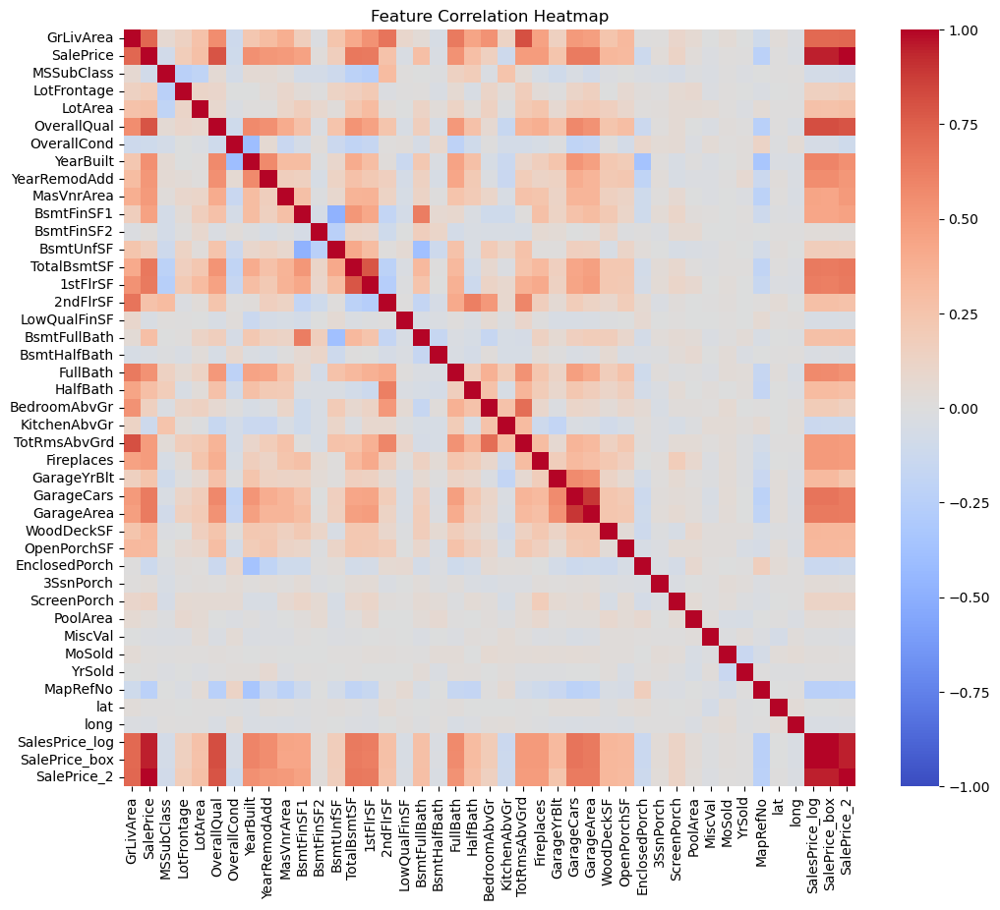

In [35]:
#select int/float
housing_d['SalePrice_2'] = housing_d['SalePrice']
corr_matrix = housing_d.select_dtypes(include=['float64','int64']).corr()

#correlation matrix

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Heatmap')
plt.show()

SalePrice         15.007373
SalesPrice_log    15.240983
SalePrice_box     15.207244
dtype: float64

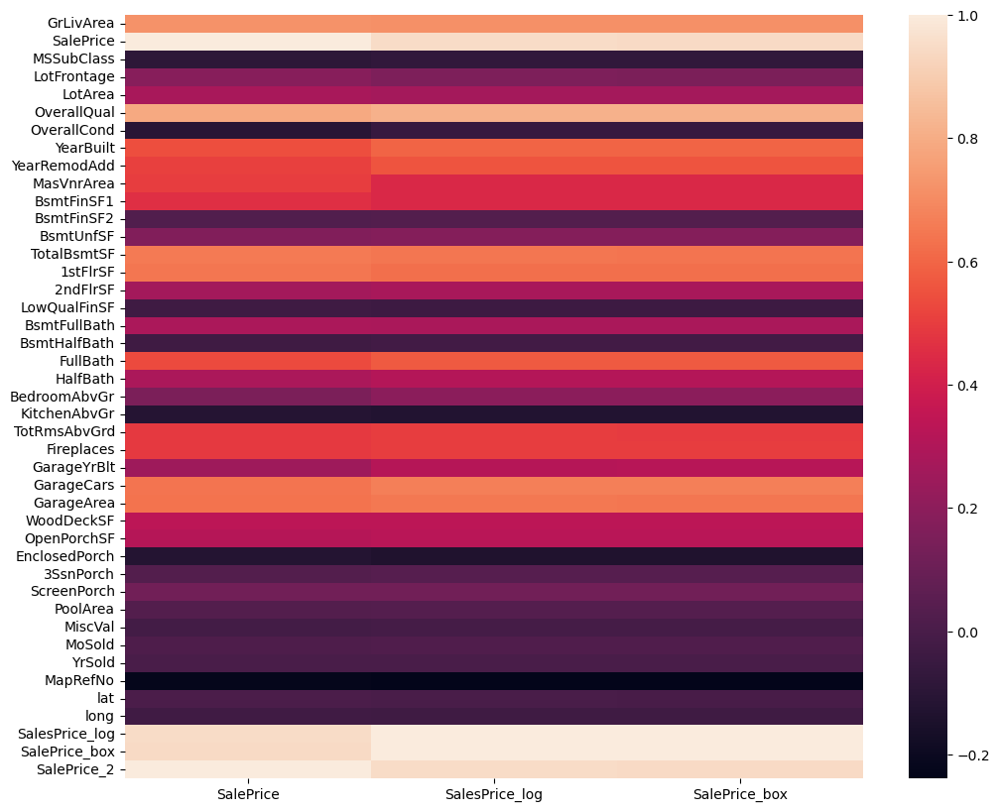

In [36]:
#Comparing corr of all the Salesprice options: 1. No change, 2. Log, 3. Box cox. No huge difference. 

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix[['SalePrice','SalesPrice_log','SalePrice_box']])
abs(corr_matrix[['SalePrice','SalesPrice_log','SalePrice_box']]).sum() #Log has the highest corr sum

Text(0.5, 1.0, 'Abs Values Feature Correlation Heatmap')

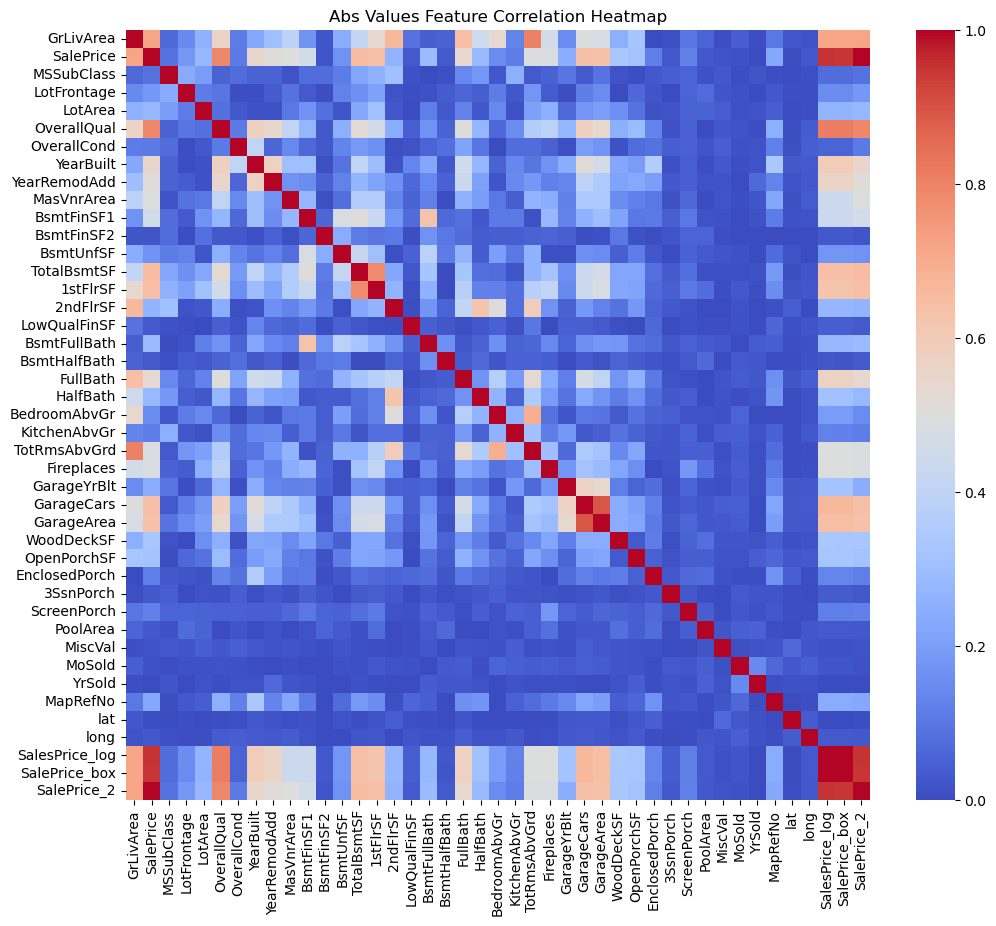

In [37]:
#absolute values correlation

plt.figure(figsize=(12, 10))
sns.heatmap(abs(corr_matrix), cmap='coolwarm', vmin=0, vmax=1)
plt.title('Abs Values Feature Correlation Heatmap')

Text(0.5, 1.0, 'Corr Threshold Map')

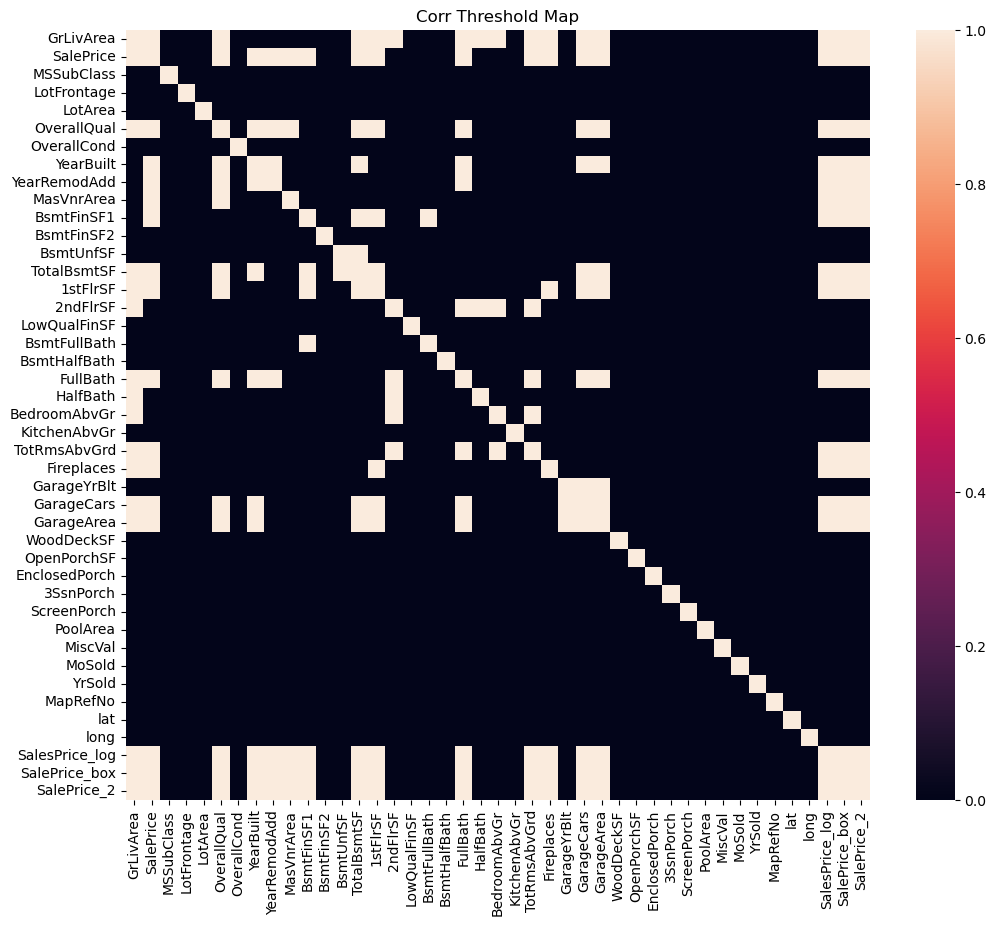

In [38]:
#Correlation Matric with threshhold

threshhold = .4

plt.figure(figsize=(12, 10))
sns.heatmap(abs(corr_matrix>threshhold))
plt.title('Corr Threshold Map')

<p><a name="top_15"></a></p>

#### Top 15 Features Correlated to SalePrice <a href="#top">[top]</a><br>

,SalePrice
SalePrice_2,1.000000
SalePrice,1.000000
SalesPrice_log,0.951051
SalePrice_box,0.946373
OverallQual,0.790285
GrLivArea,0.719803
TotalBsmtSF,0.652771
1stFlrSF,0.643106
GarageCars,0.639497
GarageArea,0.636343


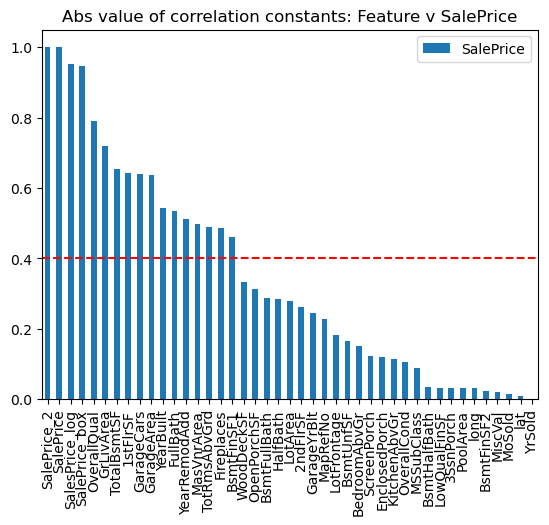

In [39]:
#Continuos variables Top 15 correlated features -- may go to feature importance. 

abs(corr_matrix[['SalePrice']]).sort_values(by = 'SalePrice', ascending = False).plot.bar(
    title = 'Abs value of correlation constants: Feature v SalePrice'
)
plt.axhline(y=0.4, color='r', linestyle='--', label='y=0.5')
top_15 = abs(corr_matrix[['SalePrice']]).sort_values(by = 'SalePrice', ascending = False).head(15)
top_15
# Top 14 Cont Features in terms of correlation. 
# Overall Condition is not highly correlated to SalespPrice. 

Text(0.5, 1.0, 'Top 15 Correlated Features Heatmap')

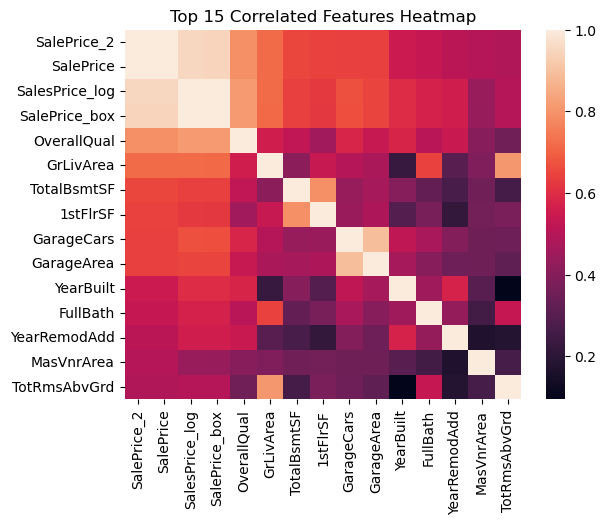

In [40]:
sns.heatmap(housing_d[top_15.index].corr())
plt.title('Top 15 Correlated Features Heatmap')

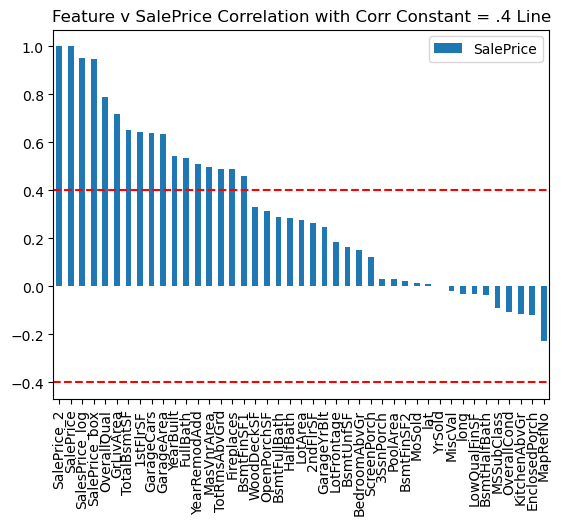

In [42]:
corr_matrix[['SalePrice']].sort_values(by = 'SalePrice', ascending = False).plot.bar(
    title = 'Feature v SalePrice Correlation with Corr Constant = .4 Line'
)
plt.axhline(y=0.4, color='r', linestyle='--', label='y=0.5')
plt.axhline(y=-0.4, color='r', linestyle='--', label='y=0.5')

#No features that are negavtively correlated to SalePrice

<p><a name="r2"></a></p>
 
 #### Multicolinearity via R2 <a href="#top">[top]</a><br>

Visualizaing all continuous variances by:
- looping through each feature and fitting ols for each feature vs all other indendents
- extracting the R squared of each outcome
- plotting r squared
- those with the highest r squared show higher multi-colinearity

<Axes: title={'center': '$R^2$ of a continuous feature against the other features'}, xlabel='index'>

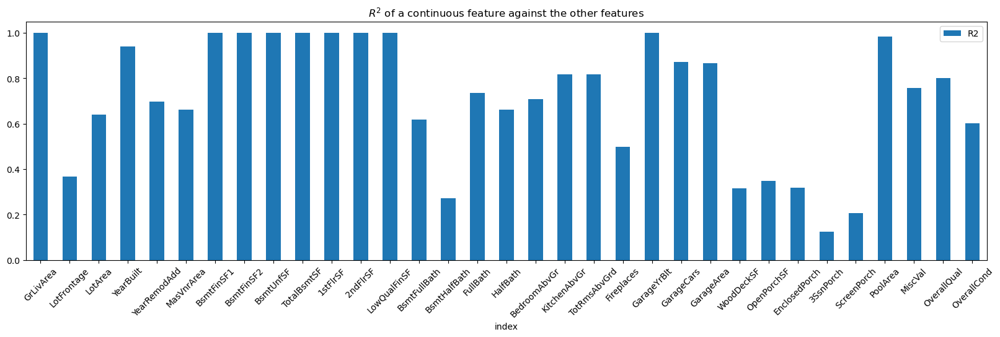

In [56]:
#Continuous Features

continuous_features = ['GrLivArea','LotFrontage','LotArea','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1',
              'BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','BsmtFullBath','BsmtHalfBath',
             'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt',
              'GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea',
              'MiscVal','OverallQual','OverallCond']
# housing_d.select_dtypes(include=['int']).drop('SalePrice', axis=1).columns
scores = {}
ols2 = LinearRegression()
from sklearn.metrics import r2_score
for feature_name in continuous_features:
                df2     = df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)
                feature = df2[feature_name].copy()
                df2.drop(feature_name, axis=1, inplace=True)
                ols2.fit(df2, feature)
                scores[feature_name] = ols2.score(df2, feature)   
scores #all the r squares of the variable vs. the other variables. High values is high correlation

pd.DataFrame(scores, index=['R2']).T.reset_index().plot.bar(x = 'index',figsize=(20, 5),rot = 45,
                                                           title = '$R^2$ of a continuous feature against the other features')


<Axes: title={'center': '$R^2$ of a basement features'}, xlabel='index'>

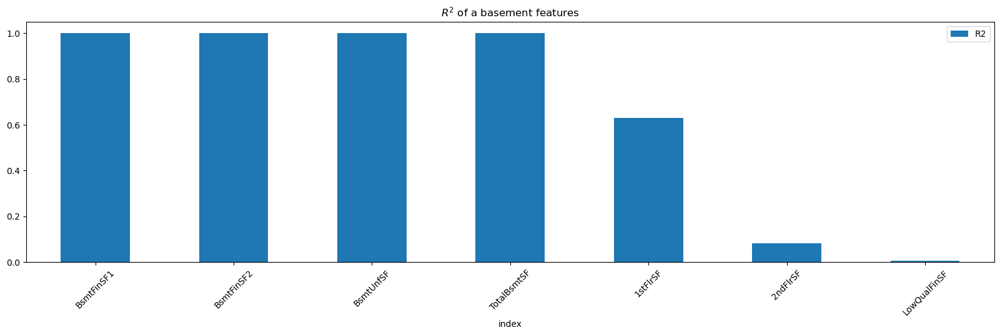

In [57]:
#Subset 1: Basement data shows high colinearity. Need to cut. 

continuous_features = ['BsmtFinSF1',
              'BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF']
# housing_d.select_dtypes(include=['int']).drop('SalePrice', axis=1).columns
scores_b = {}
ols2 = LinearRegression()
from sklearn.metrics import r2_score
for feature_name in continuous_features:
                df2     = df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[continuous_features]
                feature = df2[feature_name].copy()
                df2.drop(feature_name, axis=1, inplace=True)
                ols2.fit(df2, feature)
                scores_b[feature_name] = ols2.score(df2, feature)   
scores_b #all the r squares of the variable vs. the other variables. High values is high correlation
pd.DataFrame(scores_b, index=['R2']).T.reset_index().plot.bar(x = 'index',figsize=(20, 5),rot = 45,
                                                           title = '$R^2$ of a basement features')

Let's preform a quick OLS gut check on some key features to understand how the data is behaving. We perform Simple Linear Regression (one feature v SalePrice) to get score of most popular features. How strong is GrLivArea? OveralQual?

In [58]:
#Quick gut check OLS on GrLivArea v SalePrice

ols2.fit(df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['GrLivArea']],df_encoded[['SalePrice']])
print('r2 for simple linear on GrLivArea is ', str(ols2.score(
    df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['GrLivArea']],df_encoded[['SalePrice']])))

r2 for simple linear on GrLivArea is  0.5181170077157913


In [68]:
#Quick gut check OLS on GrLivArea v log(SalePrice)
ols2.fit(np.log10(df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['GrLivArea']]),np.log(df_encoded[['SalePrice']]))
print('And for GrLivArea v log(SalePrice), r2 is ', str(ols2.score(
    df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['GrLivArea']],np.log(df_encoded[['SalePrice']]))))

#Not yeilding good results, need to look into it more in Modelling Notebook. 

And for GrLivArea v log(SalePrice), r2 is  -67039404.97467609


In [67]:
#Overall Quality

ols2.fit(df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['OverallQual']],np.log(df_encoded[['SalePrice']]))
print('And for Overall Quality, r2 is ', str(ols2.score(
    df_encoded.drop(['SalePrice','MapRefNo','Prop_Addr','lat','long'], axis=1)[['OverallQual']],np.log(df_encoded[['SalePrice']]))))

And for Overall Quality, r2 is  0.6652034450276538


<p><a name="cat"></a></p>

### Categorical Features <a href="#top">[top]</a><br>

Because we cannot run a linear regression on a categorical (or not simply and quickly), we will run a one way ANOVA test and plot SalePrice by cateogry to visualize the data. 

1. <a href="#anova">One Way Anova</a><br>
2. <a href="#box">Boxplots</a><br>

<p><a name="anova"></a></p>

#### One Way Anovas. <a href="#top">[top]</a><br>
To get an understanding of which categorical features show different SalesPrice means, we run a one way anova. 

Null Hypothesis is that there is NO difference between means. A P<.05 confirms that the means of SalesPrice show a difference per category label. F statistic is also shown. 

In [47]:
# one way Anova example. Means for years are not stat significant.
housing_s = housing_d.copy()
housing_s['YrSold'] = housing_d['YrSold'].astype('category').cat.codes
groups = [housing_s[housing_s['YrSold'] == label]['SalePrice'] for label in housing_s['YrSold'].unique()]
anova_result = f_oneway(*groups)
anova_result.statistic,anova_result.pvalue

(0.48234828494731113, 0.7487386610066253)

In [48]:
# Complete Anova for all categorical tests

test = []
for columns in housing_s.select_dtypes(
    include=['string']).drop(
    columns = 'Prop_Addr').columns:
    housing_s[columns] = housing_d[columns].astype('category').cat.codes
    groups = [housing_s[housing_s[columns] == label]['SalePrice'] for label in housing_s[columns].unique()]
    anova_result = f_oneway(*groups)
    test.append([columns, anova_result.statistic,anova_result.pvalue])
cat_corr = pd.DataFrame(test, columns=['Feature','F_Statistic', 'P_Value'])
cat_corr.sort_values(by = 'P_Value')

,Feature,F_Statistic,P_Value
20,BsmtQual,476.453472,0.000000e+00
29,KitchenQual,536.246989,0.000000e+00
7,Neighborhood,130.811820,0.000000e+00
17,ExterQual,796.063256,0.000000e+00
32,GarageFinish,346.688045,7.302997e-189
19,Foundation,185.820459,4.134508e-169
31,GarageType,129.284281,3.731344e-143
23,BsmtFinType1,125.023875,6.650542e-139
26,HeatingQC,160.851491,6.395566e-123
22,BsmtExposure,142.800046,2.704178e-110


<p><a name="box"></a></p>

#### Boxplots <a href="#top">[top]</a><br>

By Category, includes Log(SalePrice). 

In [53]:
fig, axs = plt.subplots(82, 1, figsize=(20, 400))
for num, column in enumerate(housing_d.select_dtypes(include='string').drop(columns = 'Prop_Addr').columns):
    housing_d[[column,'SalePrice']].reset_index().groupby(column).boxplot(
        fontsize=12, column = 'SalePrice', subplots = False, ax = axs[num*2])
    axs[num*2].set_title(column)
    axs[num*2].grid(True)
    housing_d[[column,'SalesPrice_log']].reset_index().groupby(column).boxplot(
        fontsize=12, column = 'SalesPrice_log', subplots = False, ax = axs[num*2 + 1])
    axs[num*2 + 1].set_title(column + ' Log')
    axs[num*2 + 1].grid(True)
plt.show()